<h1> Lab 7: SIFT Feature Matching</h1>
<div class="description user_content student-version enhanced"><p>The task for today is to detect SIFT features in one image, match them to another image, and analyze how many matches are correct.</p>
<h3>Data</h3>
<p>We will use these images (<a class="instructure_file_link" title="graffiti.zip" href="/courses/25410/files/2294791/download?wrap=1" data-api-endpoint="https://elearning.mines.edu/api/v1/courses/25410/files/2294791" data-api-returntype="File">graffiti.zip</a>), which come from a larger dataset (http://kahlan.eps.surrey.ac.uk/featurespace/web/data.htm). The images are of a planar surface, taken from various viewpoints. Recall that a homography maps points on one plane to points on another plane (see the lecture slides on “Homography” from Week 6). The authors of the dataset provide the “ground truth” homographies between images, which you can use to determine if a point is being matched correctly. We will consider a point to matched correctly if the error distance between its ground truth location and the matched location is less than or equal to s, where s is the size of the SIFT feature.</p>
<h3>Code</h3>
<p>The Python program you need is given here (<span class="instructure_file_holder link_holder"><a class="instructure_file_link" title="main_match.py" href="/courses/25410/files/2294863/download?wrap=1" data-api-endpoint="https://elearning.mines.edu/api/v1/courses/25410/files/2294863" data-api-returntype="File">main_match.py</a><a class="file_preview_link" aria-hidden="true" href="/courses/25410/files/2294863/download?wrap=1" title="Preview the document" style="padding-left: 5px;"></a>). At the beginning of the code are algorithm parameters that you will have to adjust. The parameter “ratio_match_dist” defines the ratio of best-match-distance to second-best-match-distance. This is used to reject ambiguous matches. The smaller this ratio, the more potentially false matches are rejected, but you also lose more valid matches.</p>
<h3>Metrics</h3>
<p>We will count:</p>
<ul>
<li>TP (number of true positives), which is the number of correct matches</li>
<li>FP (number of false positives), which is the number of incorrect matches</li>
<li>P (number of actual positives), which is the number of features that should have been matched correctly (ie., the predicted location based on the homography transformation is somewhere within the query image)</li>
</ul>
<p>The metrics we want to find are:</p>
<ul>
<li>Precision = TP / (TP + FP). This tells us, of all our matches that we found, what fraction of our matches is correct. In other words, how many of our matches are “inliers”.</li>
<li>Recall = TP / P. This tells us, of all the features that should have been matched, what fraction were actually matched.</li>
</ul>
<p>We want both of these to be as high as possible, but there is a tradeoff between them. For example, raising the criteria for a valid match improves precision, but decreases recall.</p>
<h3>To do</h3>
<p>Download the code and the images. As described in the lecture on Wednesday, you will have to change the versions of OpenCV and Python, in order to use the SIFT code.</p>
<p>Run the code as is, and observe the matching features. The program prints the result of matching to the console. It also displays a green “G” at the predicted location of the ground truth point, and a yellow “D” at the location of the detected point. The size of a circles corresponds to the size of the SIFT feature.</p>
<p>Try increasing the “ratio_match_dist” parameter. You should get more true positives, but also more false positives. The program prints the number of true and false positives at the end.&nbsp;</p>
<p>Now, add code to the end of the main program to calculate recall and precision. Run the program on query images 2 and 3. Calculate recall and precision for the following values of the parameter “ratio_match_dist”: 0.5, 0.7, 0.8, 0.9, 1.0. Three significant digits are sufficient when reporting the values; it is not necessary to display the values with more digits than that.</p>
<p>Query image 2</p>
<ul>
<li>Ratio = 0.5: Recall = ?, precision = ?</li>
<li>Ratio = 0.7: Recall = ?, precision = ?</li>
<li>Ratio = 0.8: Recall = ?, precision = ?</li>
<li>Ratio = 0.9: Recall = ?, precision = ?</li>
<li>Ratio = 1.0: Recall = ?, precision = ?</li>
</ul>
<p>Query image 3</p>
<ul>
<li>Ratio = 0.5: Recall = ?, precision = ?</li>
<li>Ratio = 0.7: Recall = ?, precision = ?</li>
<li>Ratio = 0.8: Recall = ?, precision = ?</li>
<li>Ratio = 0.9: Recall = ?, precision = ?</li>
<li>Ratio = 1.0: Recall = ?, precision = ?</li>
</ul>
<p>Turn in:</p>
<ul>
<li>The values of the table.</li>
<li>Your Python program.</li>
</ul></div>


In [11]:
import numpy as np
import cv2

from IPython.display import display, HTML
import ipywidgets as widgets  # Using the ipython notebook widgets
import IPython

#Use 'jpeg' instead of 'png' (~5 times faster)
import PIL.Image
from io import BytesIO

#Use 'jpeg' instead of 'png' (~5 times faster)
def imdisplay(img, fmt='jpeg',width=500):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    new_p = PIL.Image.fromarray(img)    
    f = BytesIO()
    if new_p.mode != 'RGB':
        new_p = new_p.convert('RGB')
    new_p.save(f, fmt)
    return IPython.display.Image(data=f.getvalue(), width=width)


from IPython.display import Javascript
def preventScrolling():
    disable_js = """
    IPython.OutputArea.prototype._should_scroll = function(lines) {
        return false;
    }
    """
    display(Javascript(disable_js))

preventScrolling()

def detect_features(bgr_img, show_features=False):
    global ratio_match_dist
    detector = cv2.xfeatures2d.SIFT_create(
        nfeatures=1000,
        nOctaveLayers=3,        # default = 3
        contrastThreshold=0.04, # default = 0.04
        edgeThreshold=10,       # default = 10
        sigma=1.6               # default = 1.6
    )

    # Extract keypoints and descriptors from image.
    gray_image = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2GRAY)
    keypoints, descriptors = detector.detectAndCompute(gray_image, mask=None)

    # Optionally draw detected keypoints.
    if show_features:
        # Possible flags: DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, DRAW_MATCHES_FLAGS_DEFAULT
        bgr_display = bgr_img.copy()
        cv2.drawKeypoints(image=bgr_display, keypoints=keypoints,
                          outImage=bgr_display,
                          flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        print("Number of keypoints: ", len(keypoints))
    return keypoints, descriptors

##############
# Algorithm parameters.

# Define which image is the query image (img2.png, img3.png, etc).
# The reference image is always img1.png.
# Define the ratio of best-match-distance to second-best-match-distance.  This is used to
# reject ambiguous matches.  The smaller this ratio, the more potentially false matches
# are rejected, but you also lose more valid matches.
# ratio_match_dist = 0.2      # Should be in the range (0..1]

##############
def displayMatches(steps, start_distance=0.5):
    steps = np.linspace(start_distance,1,steps+1)
    if steps[0] == 0: steps = steps[1:]

    index_of_query_image = 2        # Should be in the range 2..6 inclusive

    # Ground truth homographies between images 1 and 2, 1 and 3, 1 and 4, etc.
    Homographies = np.array([
        np.array([[0.87976964, 0.31245438, -39.430589],     # H_1_2
                  [-0.18389418, 0.93847198, 153.15784],
                  [0.00019641425, -1.6015275e-05, 1.0]]),
        np.array([[0.76285898, -0.29922929, 225.67123],     # H_1_3
                  [0.33443473, 1.0143901, -76.999973],
                  [0.00034663091, -1.4364524e-05, 1.0]]),
        np.array([[0.66378505, 0.68003334, -31.230335],     # H_1_4
                  [-0.144955, 0.97128304, 148.7742],
                  [0.00042518504, -1.3930359e-05, 1.0]]),
        np.array([[0.62544644, 0.057759174, 222.01217],     # H_1_5
                  [0.22240536, 1.1652147, -25.605611],
                  [0.00049212545, -3.6542424e-05, 1.0]]),
        np.array([[0.4271459, -0.67181765, 453.61534],     # H_1_6
                  [0.44106579, 1.013323, -46.534569],
                  [0.00051887712, -7.8853731e-05, 1.0]])
    ])
    results = dict([])
    for index in range(index_of_query_image,7):
        for step in steps:
            ratio_match_dist = np.round(step,4)
            filename1 = "img1.png"
            filename2 = "img%d.png" % index
            
            # Get homography between image 1 and the query image.
            H = Homographies[index_of_query_image-2]

            bgr_img1 = cv2.imread(filename1)
            bgr_img2 = cv2.imread(filename2)

            image_height = bgr_img1.shape[0]
            image_width = bgr_img1.shape[1]

            keypoints1, desc1 = detect_features(bgr_img1, show_features=False)
            keypoints2, desc2 = detect_features(bgr_img2, show_features=False)


            # Match image descriptors.
            matcher = cv2.BFMatcher(cv2.NORM_L2)    # Creates a brute force matcher object

            # Use k nearest neighbor matching and apply ratio test.
            matches = matcher.knnMatch(desc1, desc2, k=2)
            good = []
            for m, n in matches:
                if m.distance < ratio_match_dist * n.distance:
                    good.append(m)
            matches = good
            display(HTML(f'''<h3>Image: {index}, Match Distance: {ratio_match_dist}</h3>'''))
            print("Number of matches between images: ", len(matches))
            bgr_matches = cv2.drawMatches(img1=bgr_img1, keypoints1=keypoints1,
                                          img2=bgr_img2, keypoints2=keypoints2,
                                          matches1to2=matches, matchesMask=None, 
                                          outImg=None)
            display(imdisplay(bgr_matches, width=900))


            # Analyze matches.
            true_positives = 0   # Number of correct matches
            false_positives = 0   # Number of incorrect matches
            actual_positives = 0    # Number of actual positives (ie, feature is in query image)

            for id1, kp1 in enumerate(keypoints1):
                p1 = np.array(kp1.pt)       # We detected a keypoint here in image 1

                bgr_display1 = bgr_img1.copy()
                bgr_display2 = bgr_img2.copy()

                # Display the feature on image 1.
                x = int(round(p1[0]))
                y = int(round(p1[1]))
                cv2.circle(bgr_display1, center=(x,y), radius=int(kp1.size),
                           color=(0,255,255), thickness=2)
                cv2.putText(img=bgr_display1, org=(x,y-5), text=str(id1), fontFace=cv2.FONT_HERSHEY_PLAIN,
                            fontScale=1.5, color=(0, 255, 255), thickness=2)

                # Apply the known transform to the point to see where it should be in image 2.
                pg = H @ np.array([p1[0], p1[1], 1])
                pg /= pg[2]  # Ground truth location

                # See if the feature should have been found (ie, is in the image).
                if pg[0] >= 0 and pg[0] < image_width and pg[1] >= 0 and pg[1] < image_height:
                    # print("Actual positive (feature should be matchable)")
                    actual_positives += 1

                # Display the ground truth location on image 2.
                x = int(round(pg[0]))
                y = int(round(pg[1]))
                cv2.circle(bgr_display2, center=(x,y), radius=int(kp1.size),
                           color=(0,255,0), thickness=-1)
                cv2.putText(img=bgr_display2, org=(x,y-5), text='G', fontFace=cv2.FONT_HERSHEY_PLAIN,
                            fontScale=1.5, color=(0, 255, 0), thickness=2)

                # Find the match (if any) for this keypoint.
                match = next((match for match in matches if match.queryIdx == id1), None)

                if match is not None:
                    # A match was found.
                    kp2 = keypoints2[match.trainIdx]
                    p2 = np.array(kp2.pt)  # detected match location

                    # Display the matching feature in image 2.
                    x = int(round(p2[0]))
                    y = int(round(p2[1]))
                    cv2.circle(bgr_display2, center=(x, y), radius=int(kp2.size),
                               color=(0, 255, 255), thickness=2)
                    cv2.putText(img=bgr_display2, org=(x + 5, y), text='D',
                                fontFace=cv2.FONT_HERSHEY_PLAIN,
                                fontScale=1.5, color=(0, 255, 255), thickness=2)

                    # See if the match was correct.
                    d = np.linalg.norm(p2 - pg[0:2])  # Error distance
                    # Assume match is correct if error is smaller than the feature size.
                    if d < kp1.size:
                        # print("Found a match: True positive")
                        true_positives += 1
                    else:
                        # print("Found a match: False positive")
                        false_positives += 1
            print("True Positives:\t", true_positives)
            print("False Positives:\t", false_positives)
            print("Actual Positives:\t", actual_positives)
            if (true_positives + false_positives != 0):
                precision = np.round(true_positives/(true_positives+false_positives),4)
                recall = np.round(true_positives/actual_positives, 4)
                print(f'''Precision:\t{precision}''')
                print(f'''Recall:\t{recall}''')
                if filename2 in results:
                    results[filename2].append([ratio_match_dist, precision, recall])
                else:
                    results[filename2] = ([[ratio_match_dist, precision, recall]])
            else:
                print("No true positives or false positives")

    return results


<IPython.core.display.Javascript object>

Number of matches between images:  370


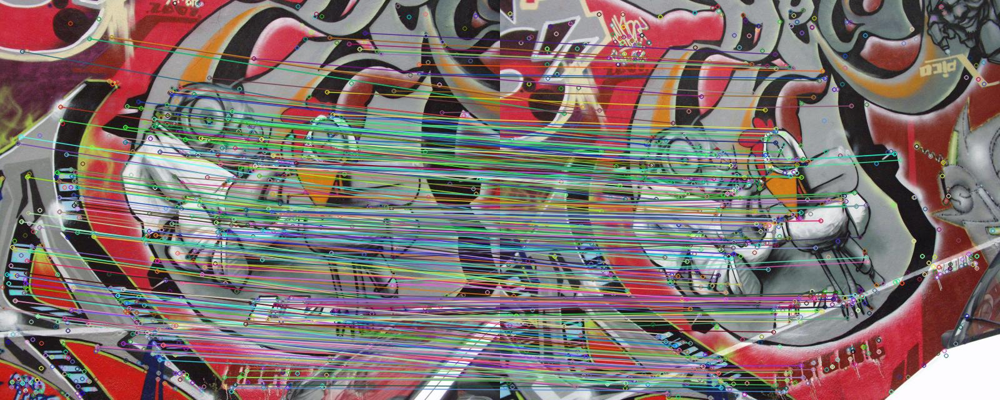

True Positives:	 361
False Positives:	 9
Actual Positives:	 904
Precision:	0.9757
Recall:	0.3993


Number of matches between images:  403


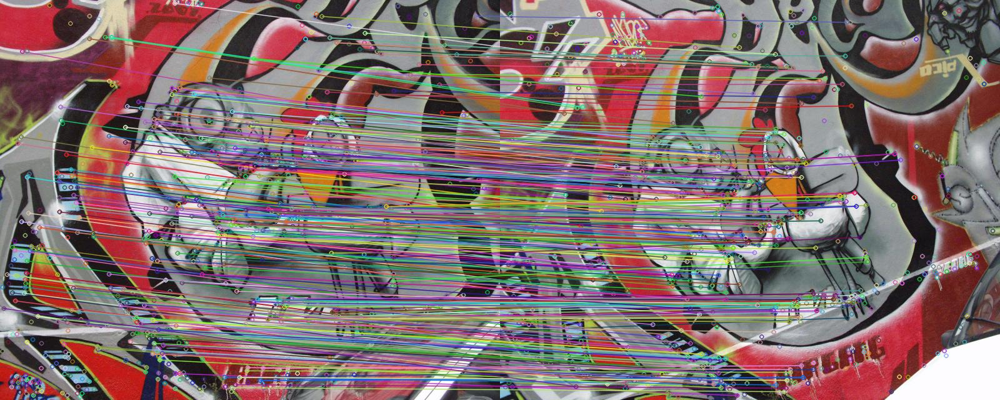

True Positives:	 391
False Positives:	 12
Actual Positives:	 904
Precision:	0.9702
Recall:	0.4325


Number of matches between images:  422


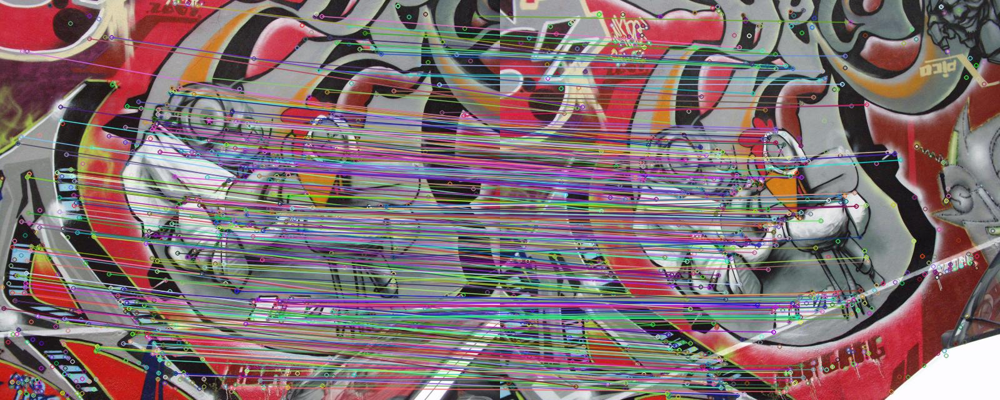

True Positives:	 410
False Positives:	 12
Actual Positives:	 904
Precision:	0.9716
Recall:	0.4535


Number of matches between images:  441


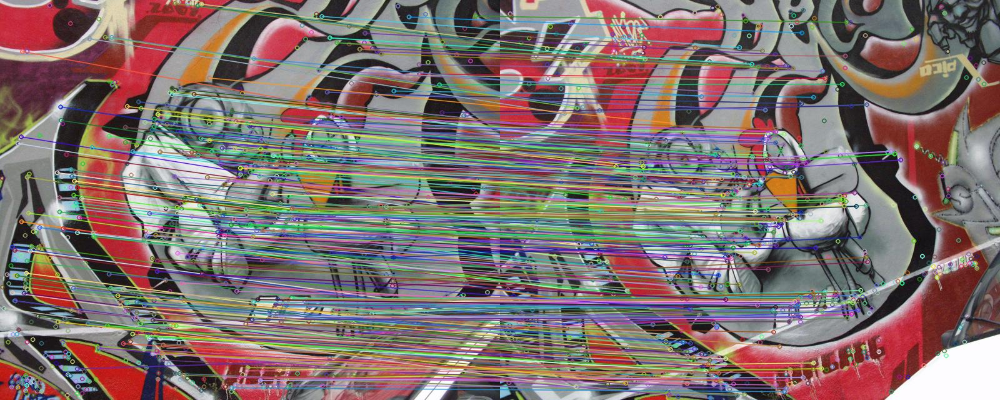

True Positives:	 423
False Positives:	 18
Actual Positives:	 904
Precision:	0.9592
Recall:	0.4679


Number of matches between images:  457


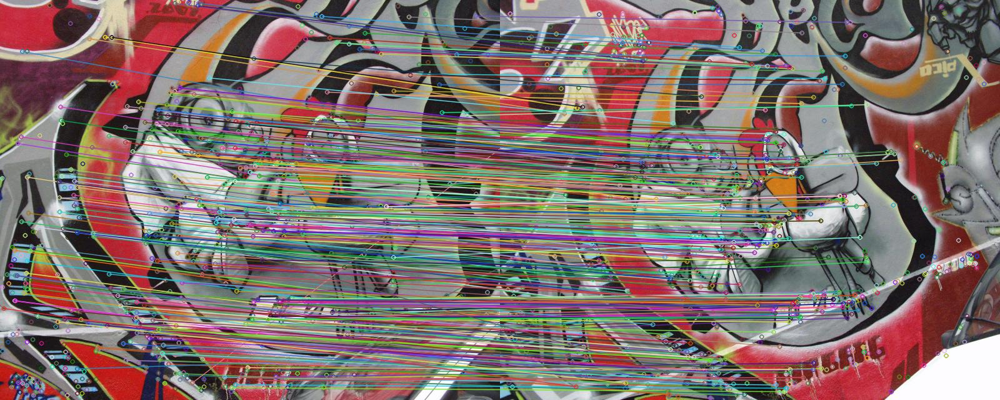

True Positives:	 433
False Positives:	 24
Actual Positives:	 904
Precision:	0.9475
Recall:	0.479


Number of matches between images:  474


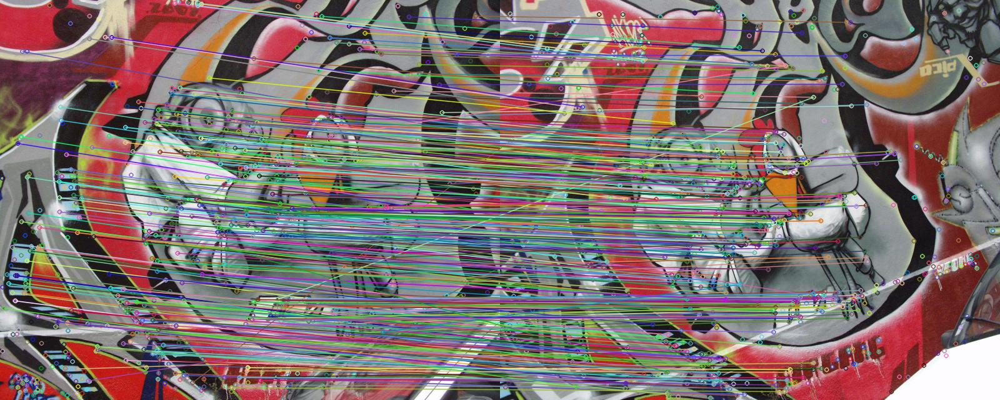

True Positives:	 444
False Positives:	 30
Actual Positives:	 904
Precision:	0.9367
Recall:	0.4912


Number of matches between images:  494


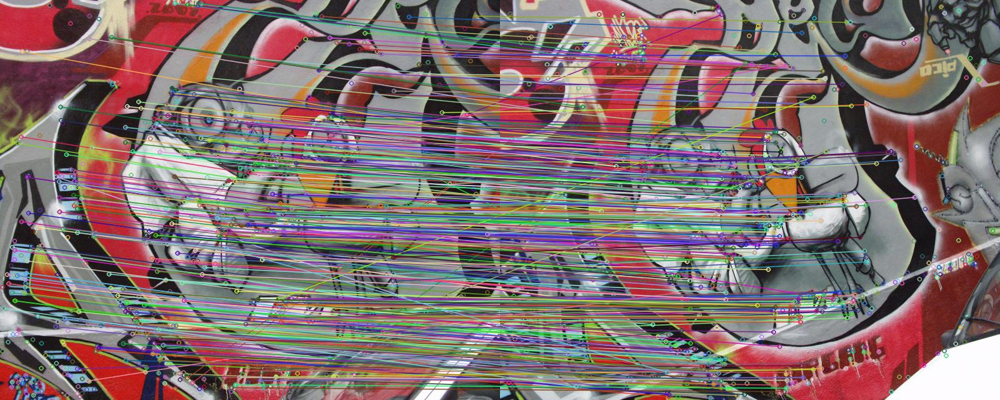

True Positives:	 452
False Positives:	 42
Actual Positives:	 904
Precision:	0.915
Recall:	0.5


Number of matches between images:  534


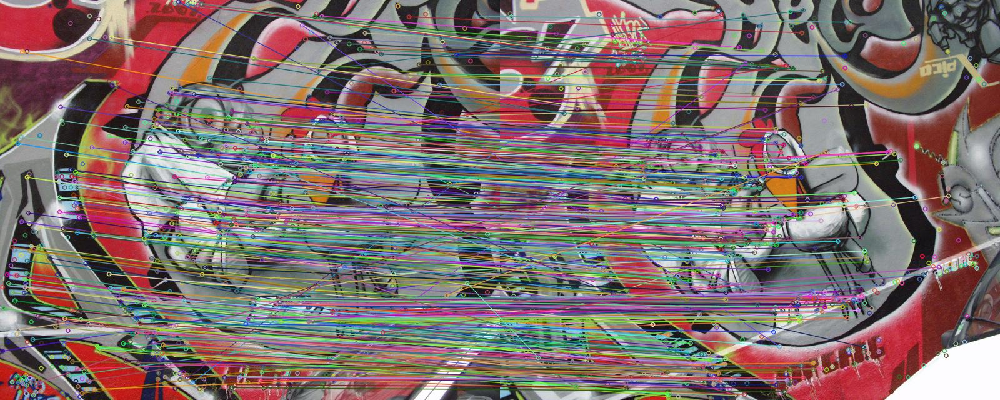

True Positives:	 461
False Positives:	 73
Actual Positives:	 904
Precision:	0.8633
Recall:	0.51


Number of matches between images:  591


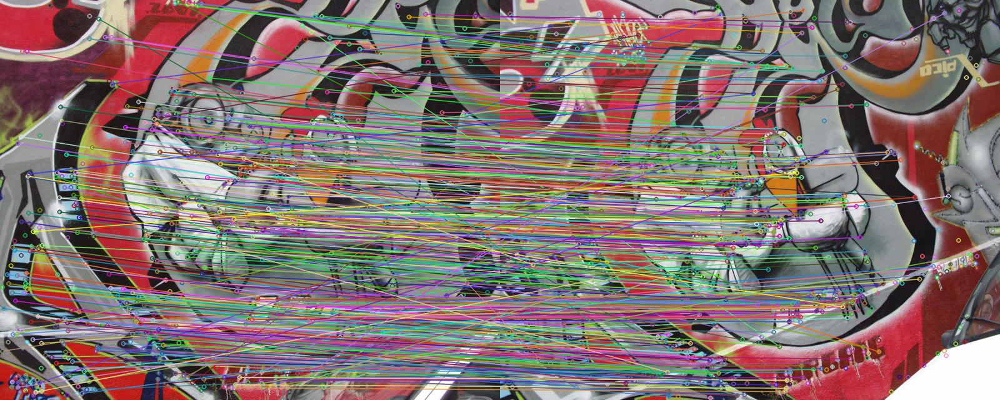

True Positives:	 467
False Positives:	 124
Actual Positives:	 904
Precision:	0.7902
Recall:	0.5166


Number of matches between images:  715


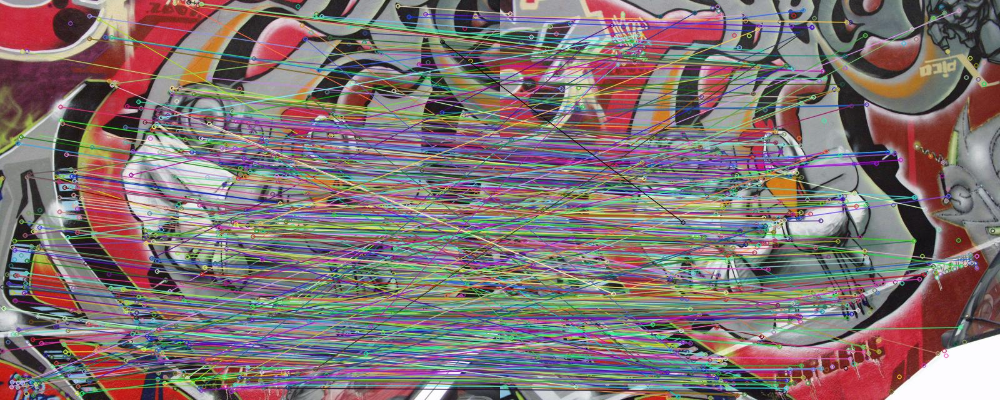

True Positives:	 475
False Positives:	 240
Actual Positives:	 904
Precision:	0.6643
Recall:	0.5254


Number of matches between images:  1001


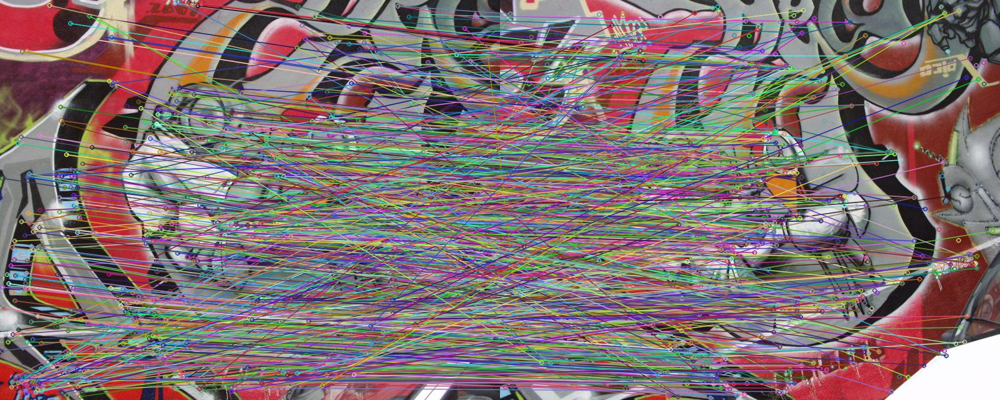

True Positives:	 478
False Positives:	 523
Actual Positives:	 904
Precision:	0.4775
Recall:	0.5288


Number of matches between images:  34


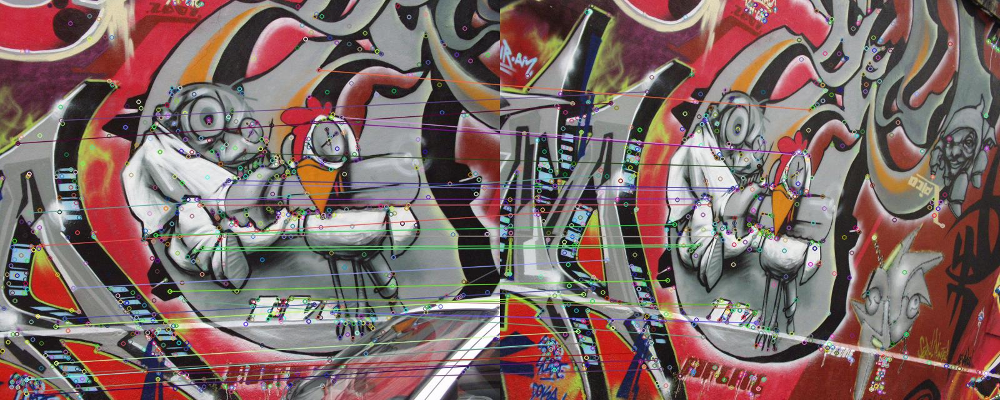

True Positives:	 0
False Positives:	 34
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  59


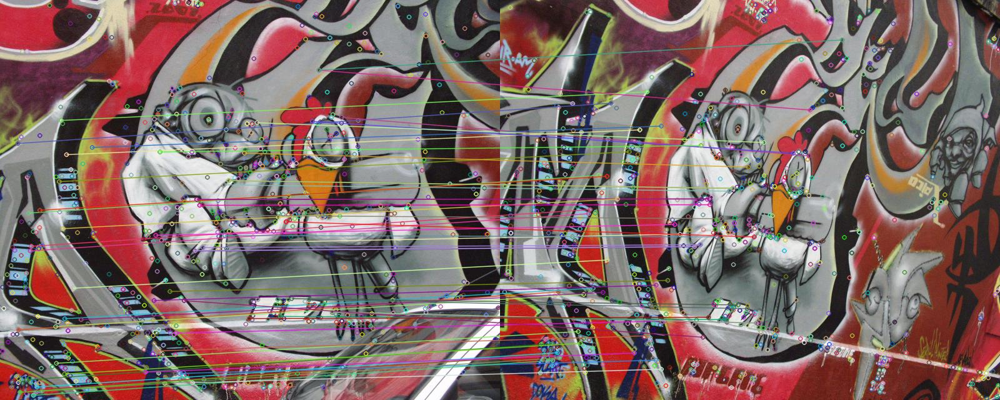

True Positives:	 0
False Positives:	 59
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  108


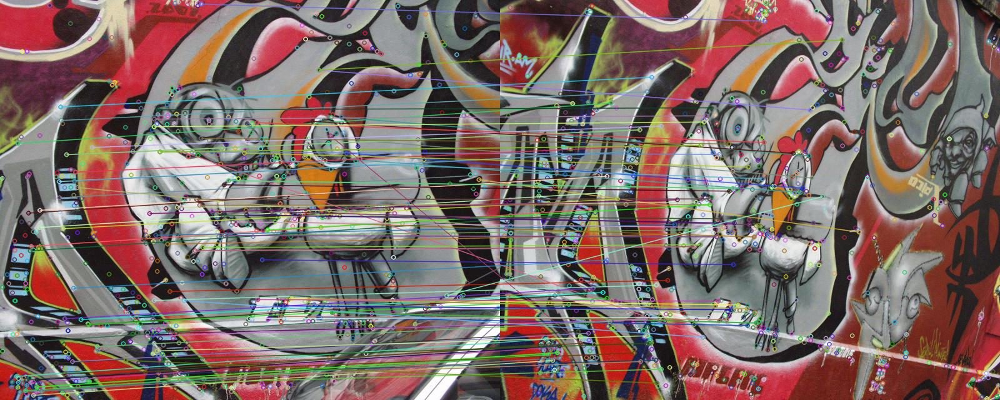

True Positives:	 0
False Positives:	 108
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  151


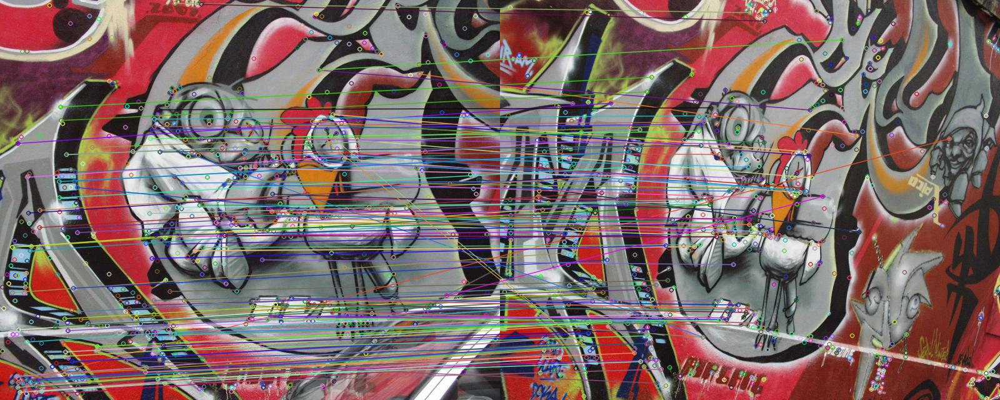

True Positives:	 2
False Positives:	 149
Actual Positives:	 904
Precision:	0.0132
Recall:	0.0022


Number of matches between images:  202


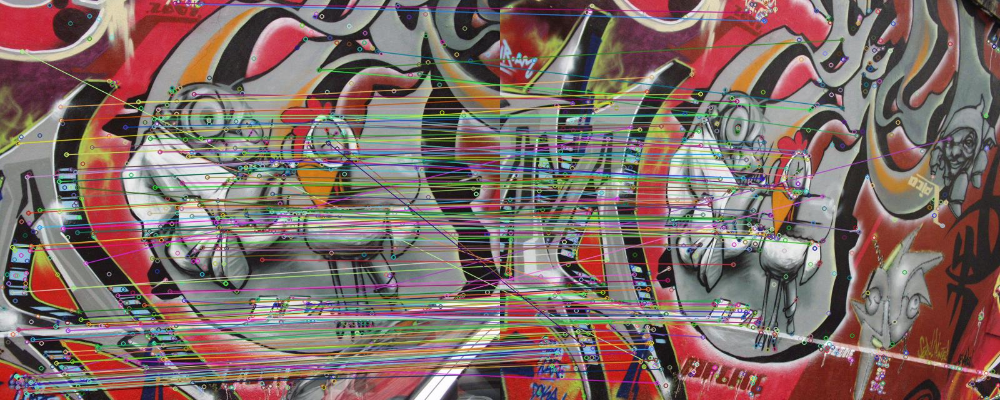

True Positives:	 4
False Positives:	 198
Actual Positives:	 904
Precision:	0.0198
Recall:	0.0044


Number of matches between images:  252


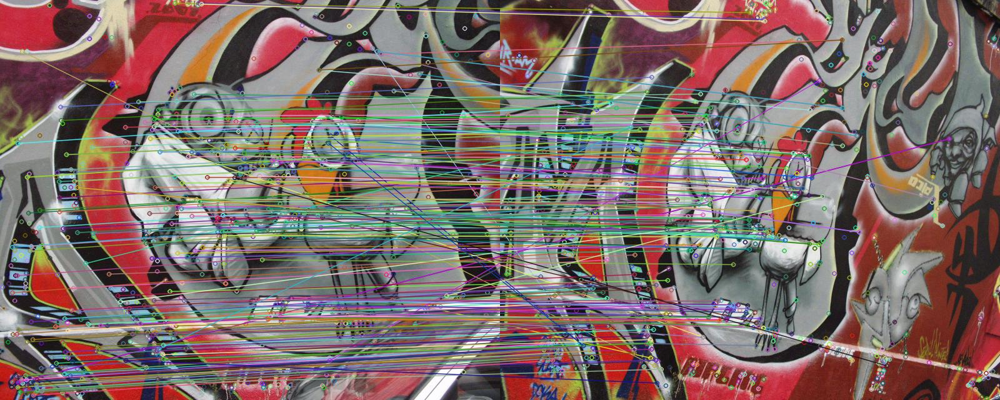

True Positives:	 4
False Positives:	 248
Actual Positives:	 904
Precision:	0.0159
Recall:	0.0044


Number of matches between images:  305


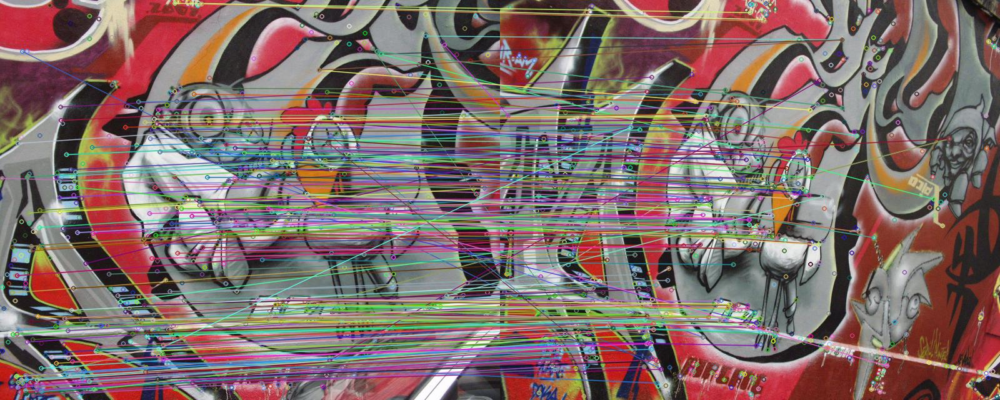

True Positives:	 4
False Positives:	 301
Actual Positives:	 904
Precision:	0.0131
Recall:	0.0044


Number of matches between images:  363


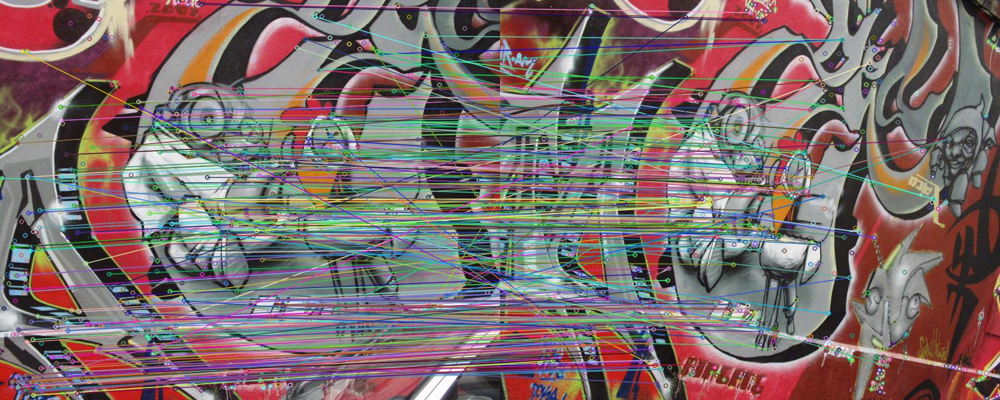

True Positives:	 4
False Positives:	 359
Actual Positives:	 904
Precision:	0.011
Recall:	0.0044


Number of matches between images:  465


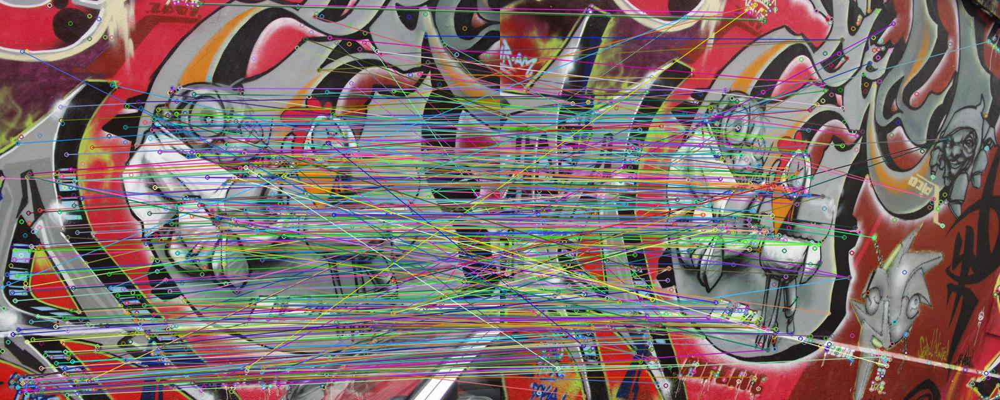

True Positives:	 4
False Positives:	 461
Actual Positives:	 904
Precision:	0.0086
Recall:	0.0044


Number of matches between images:  634


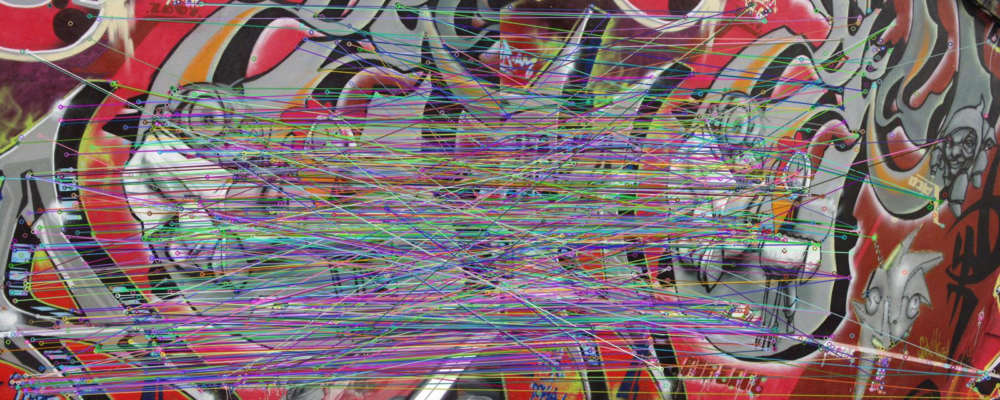

True Positives:	 4
False Positives:	 630
Actual Positives:	 904
Precision:	0.0063
Recall:	0.0044


Number of matches between images:  1001


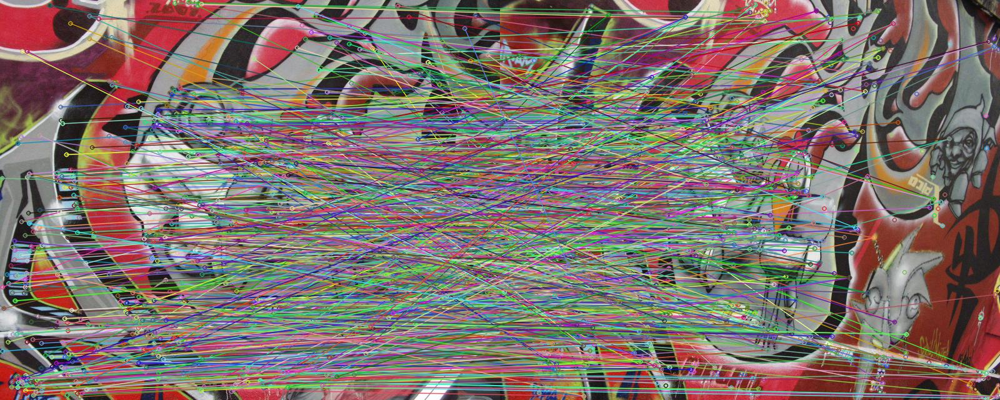

True Positives:	 4
False Positives:	 997
Actual Positives:	 904
Precision:	0.004
Recall:	0.0044


Number of matches between images:  2


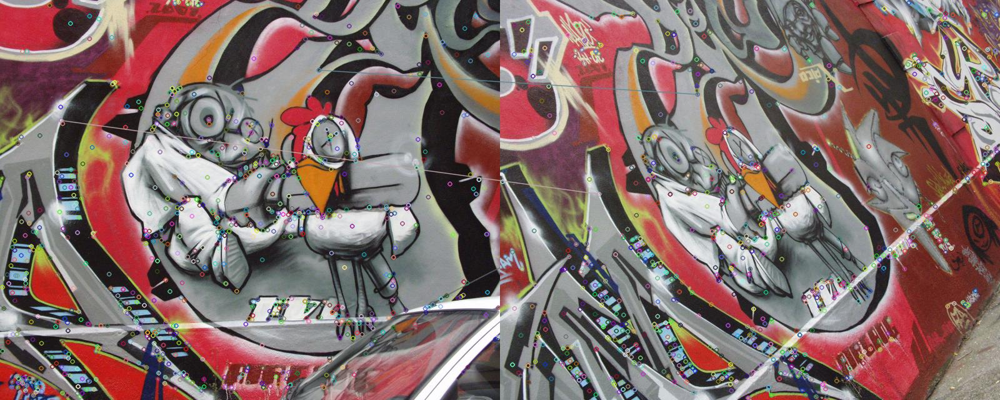

True Positives:	 0
False Positives:	 2
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  6


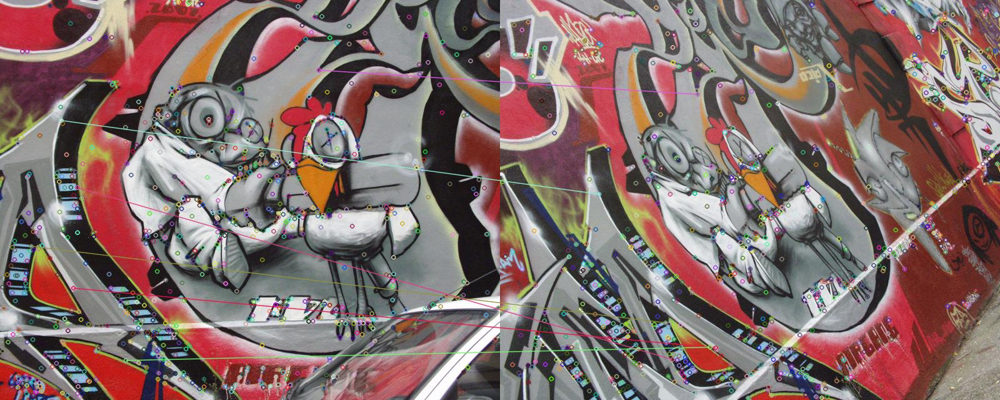

True Positives:	 0
False Positives:	 6
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  9


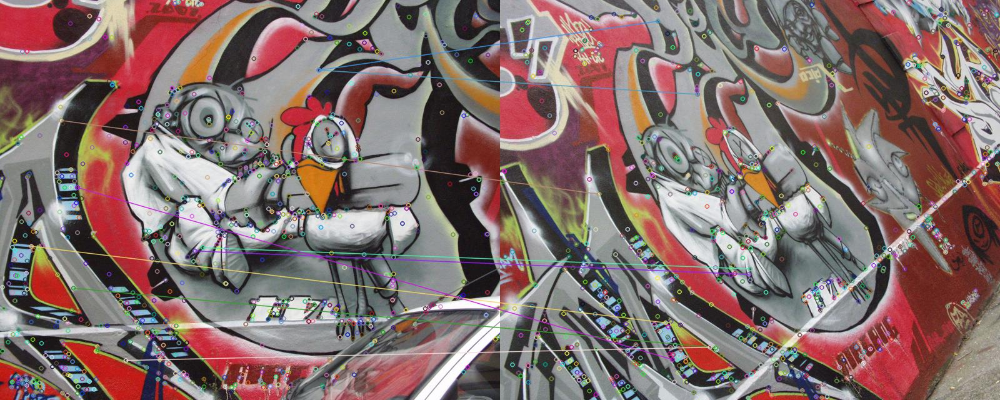

True Positives:	 0
False Positives:	 9
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  20


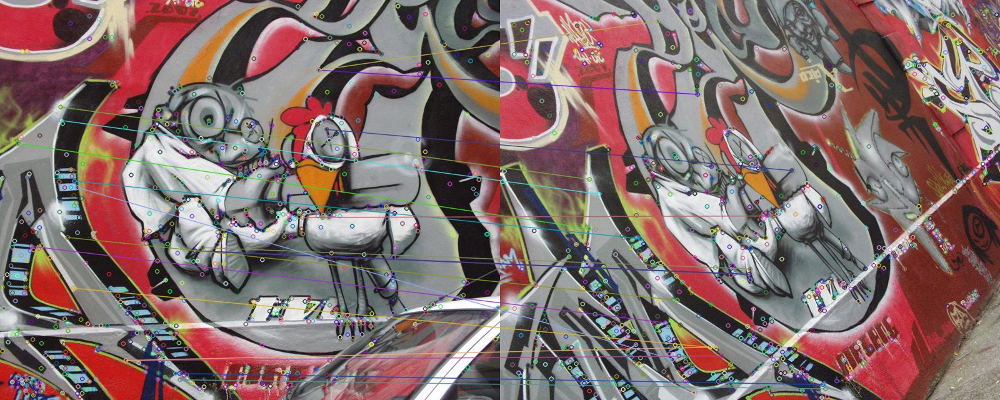

True Positives:	 0
False Positives:	 20
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  29


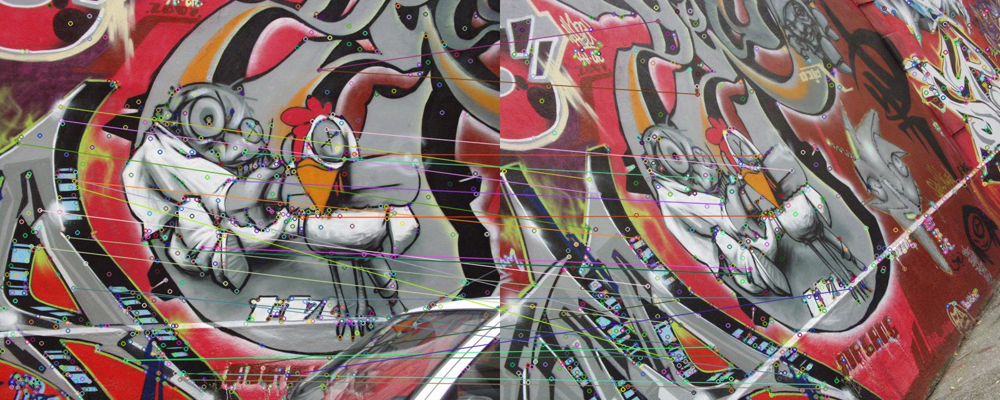

True Positives:	 0
False Positives:	 29
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  48


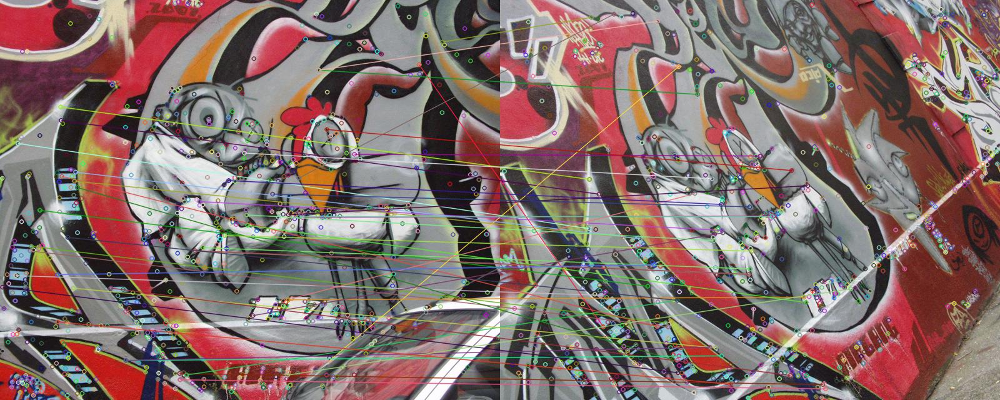

True Positives:	 0
False Positives:	 48
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  92


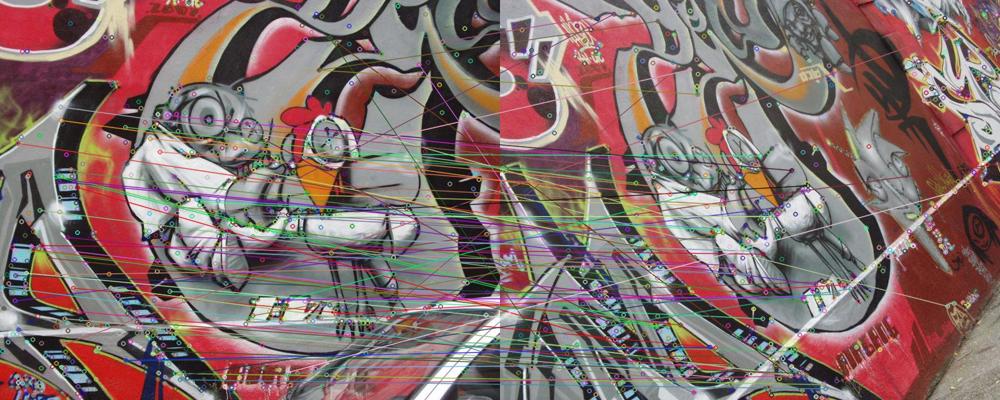

True Positives:	 3
False Positives:	 89
Actual Positives:	 904
Precision:	0.0326
Recall:	0.0033


Number of matches between images:  165


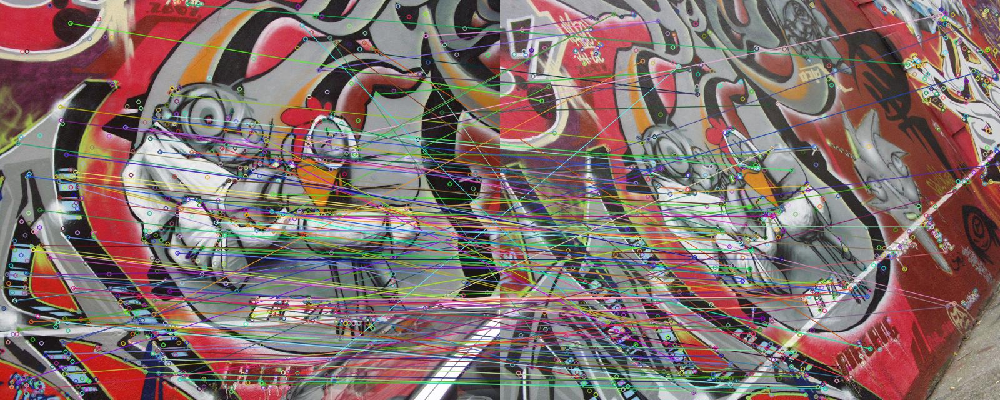

True Positives:	 5
False Positives:	 160
Actual Positives:	 904
Precision:	0.0303
Recall:	0.0055


Number of matches between images:  285


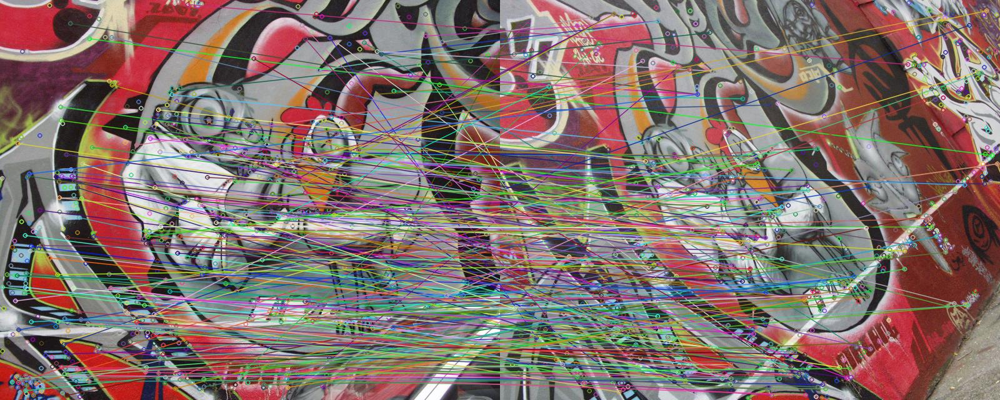

True Positives:	 8
False Positives:	 277
Actual Positives:	 904
Precision:	0.0281
Recall:	0.0088


Number of matches between images:  528


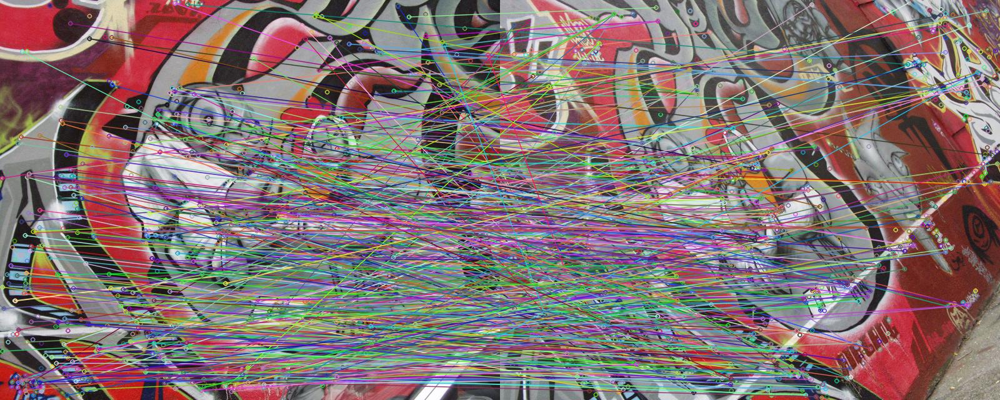

True Positives:	 8
False Positives:	 520
Actual Positives:	 904
Precision:	0.0152
Recall:	0.0088


Number of matches between images:  1001


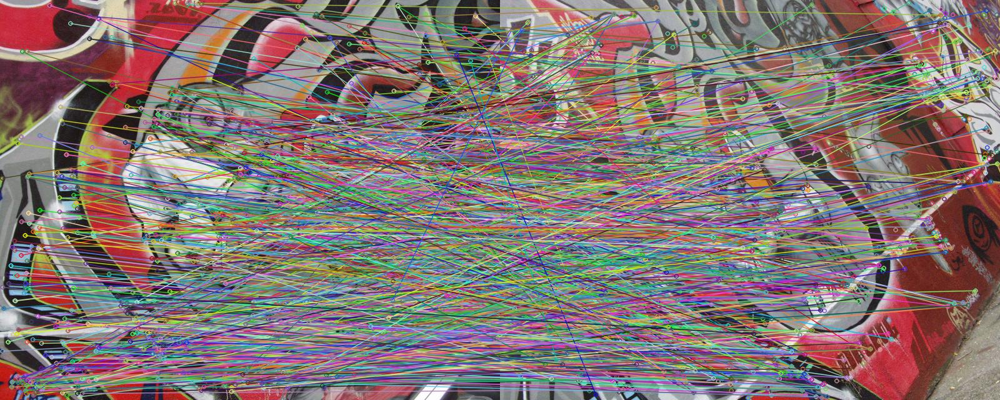

True Positives:	 11
False Positives:	 990
Actual Positives:	 904
Precision:	0.011
Recall:	0.0122


Number of matches between images:  1


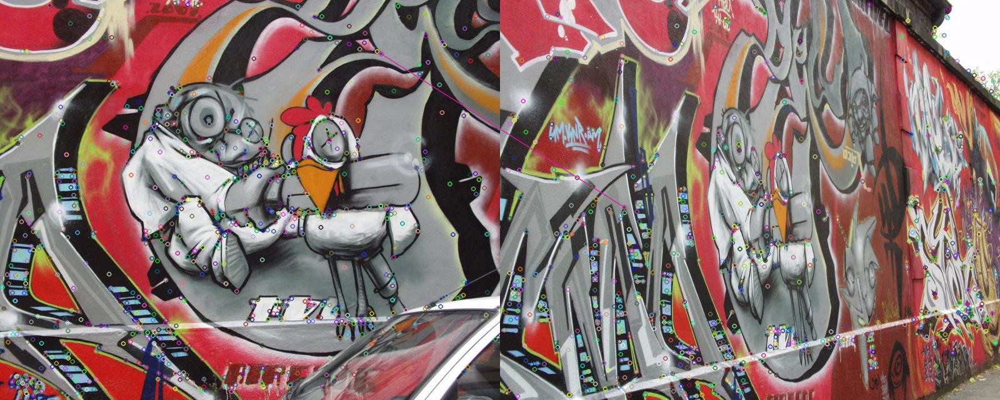

True Positives:	 0
False Positives:	 1
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  3


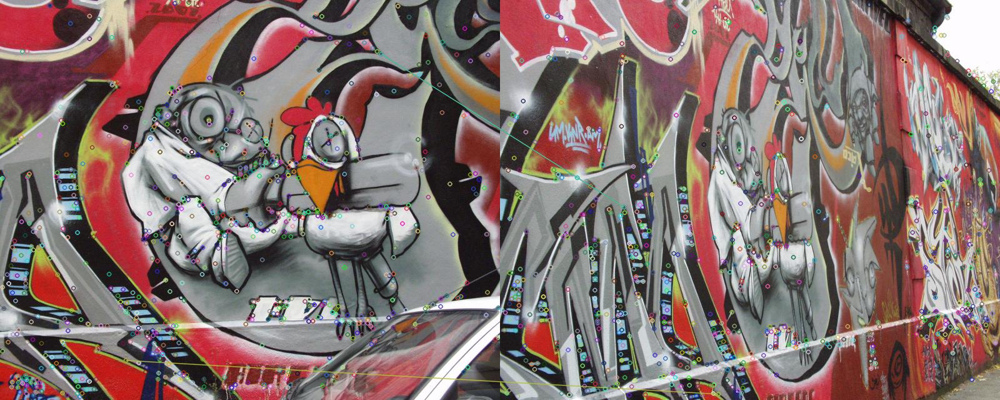

True Positives:	 0
False Positives:	 3
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  6


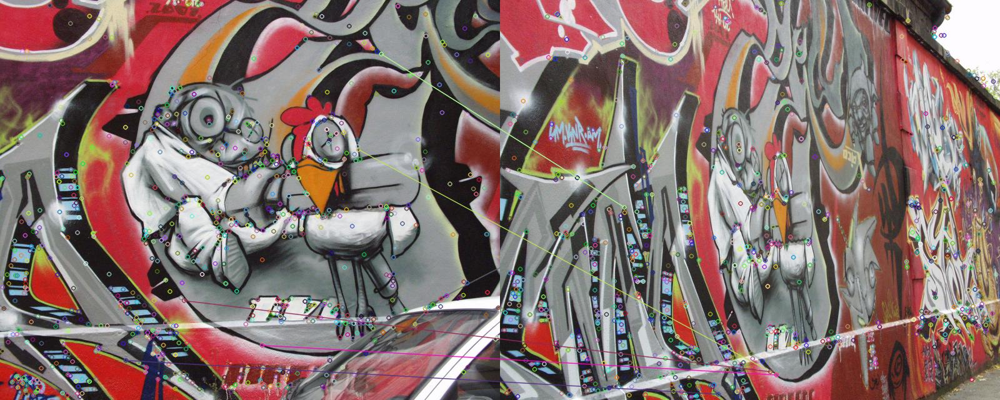

True Positives:	 0
False Positives:	 6
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  11


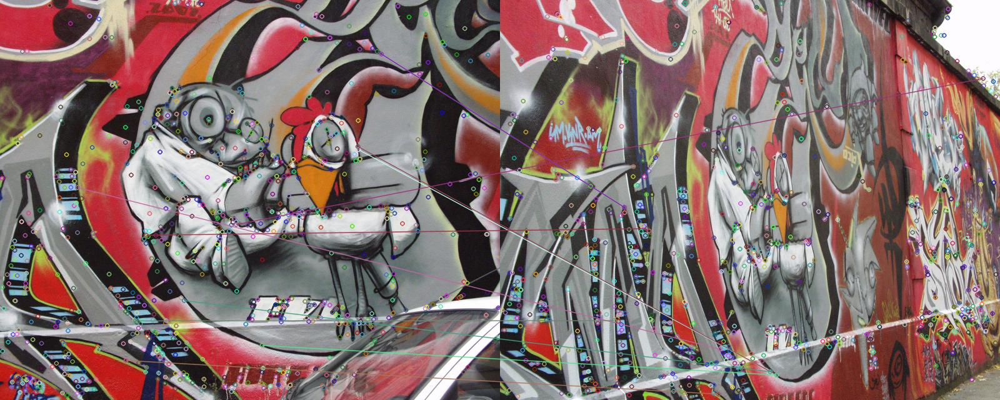

True Positives:	 0
False Positives:	 11
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  14


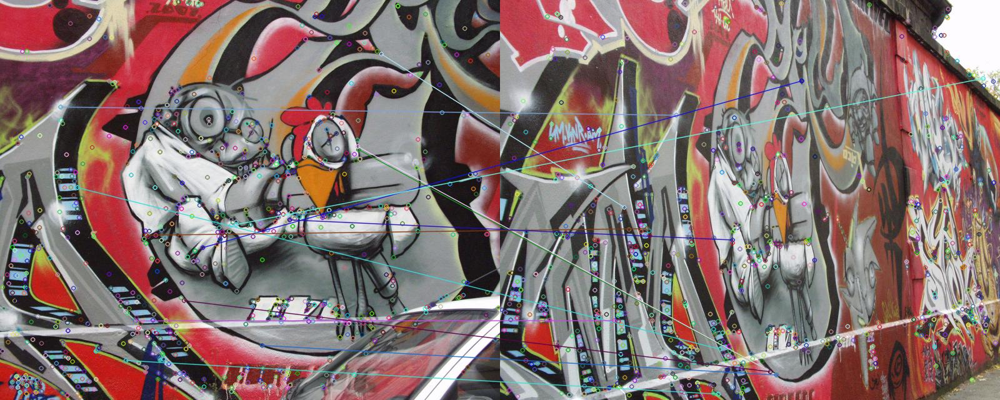

True Positives:	 0
False Positives:	 14
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  33


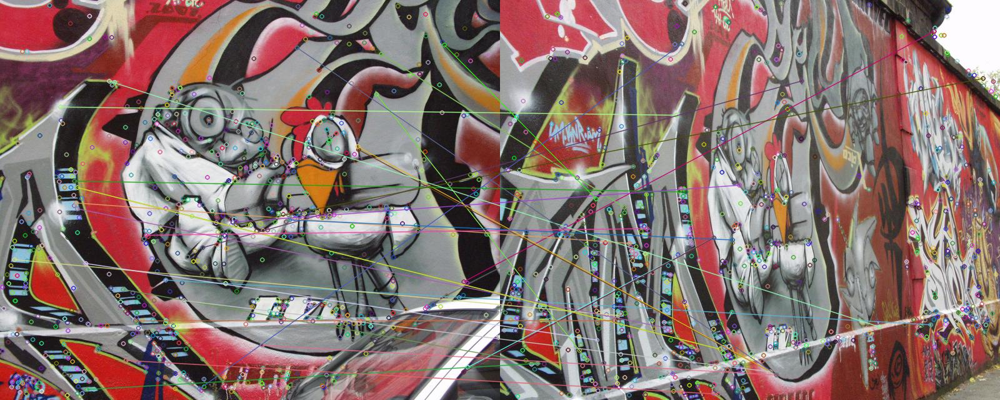

True Positives:	 0
False Positives:	 33
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  60


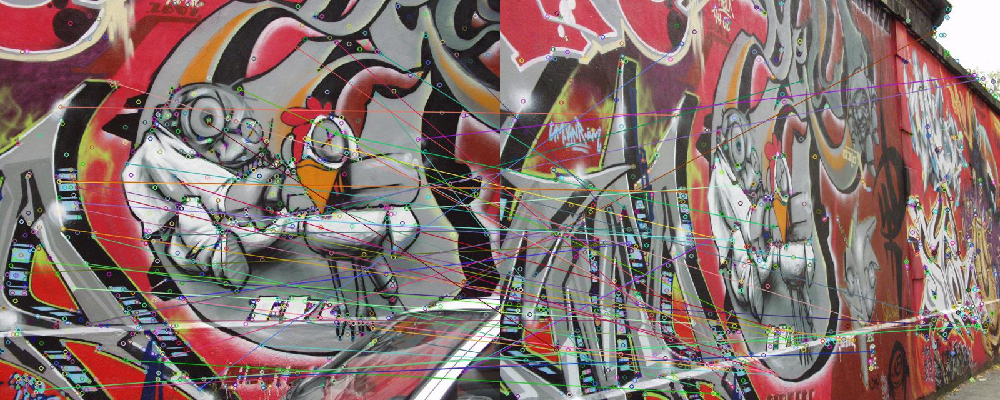

True Positives:	 0
False Positives:	 60
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  114


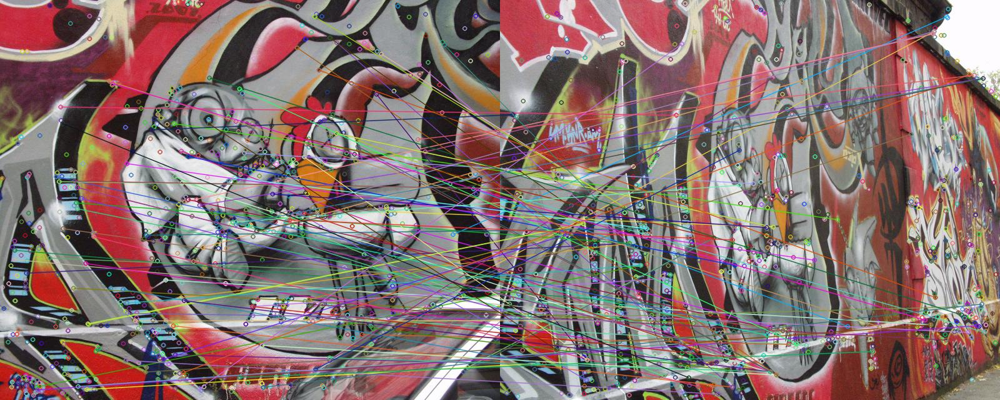

True Positives:	 0
False Positives:	 114
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  224


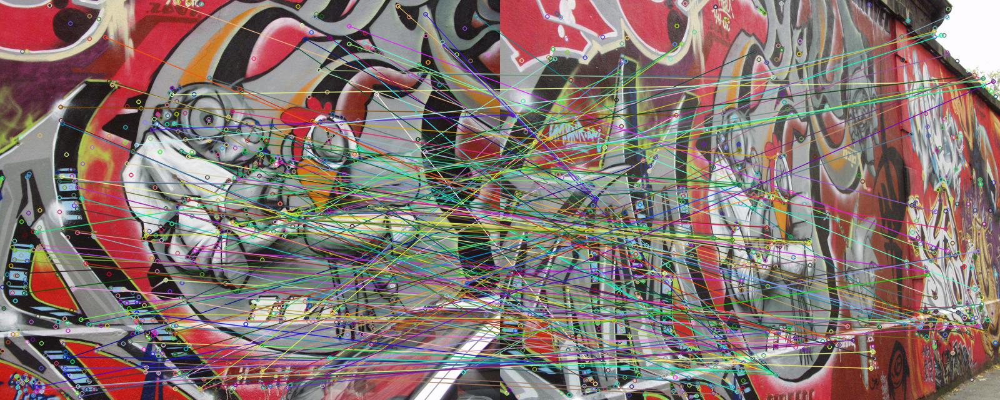

True Positives:	 0
False Positives:	 224
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  455


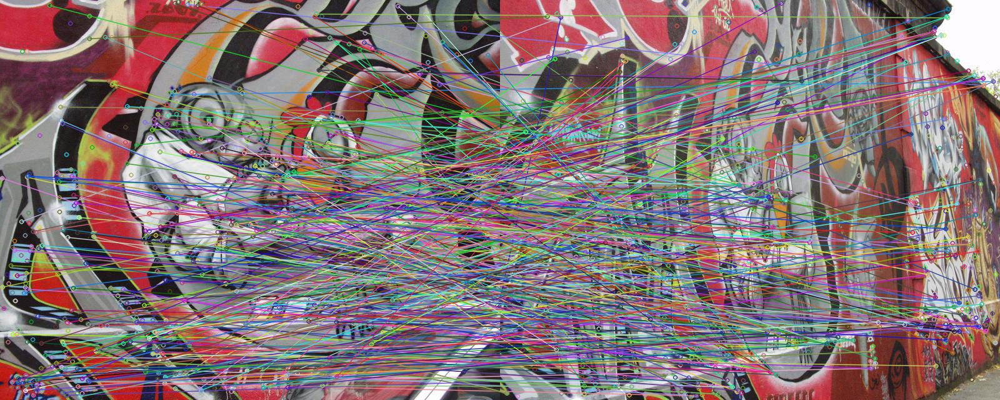

True Positives:	 0
False Positives:	 455
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  1001


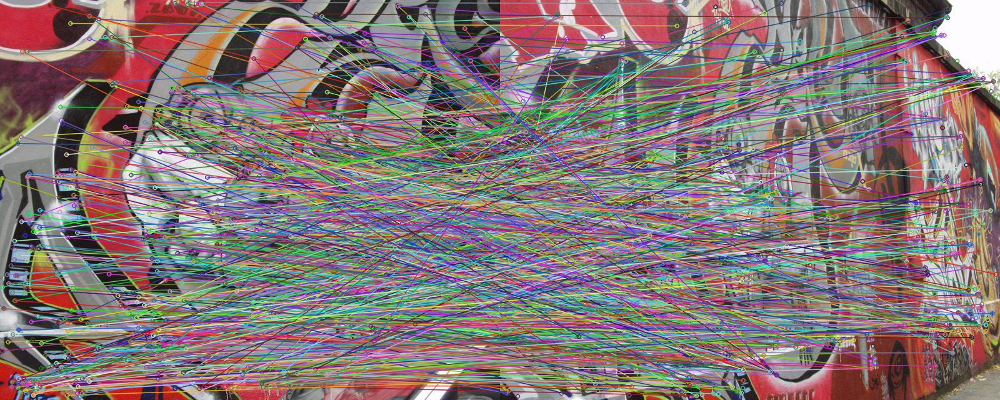

True Positives:	 0
False Positives:	 1001
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  0


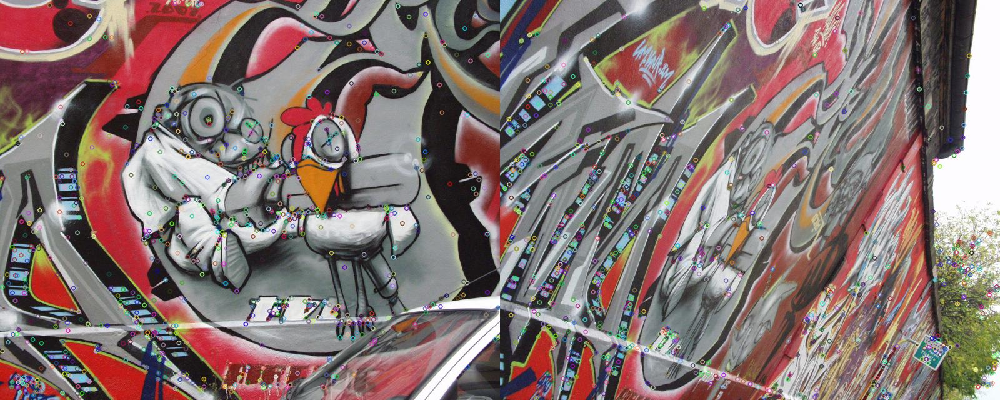

True Positives:	 0
False Positives:	 0
Actual Positives:	 904
No true positives or false positives


Number of matches between images:  1


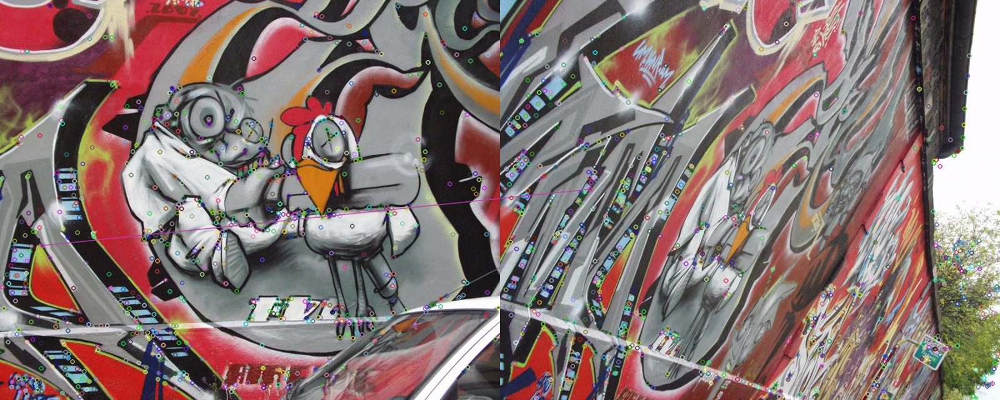

True Positives:	 0
False Positives:	 1
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  3


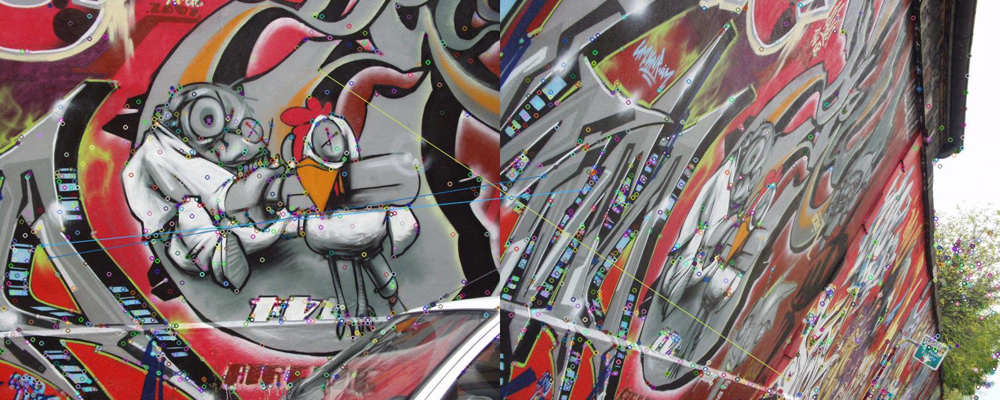

True Positives:	 0
False Positives:	 3
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  3


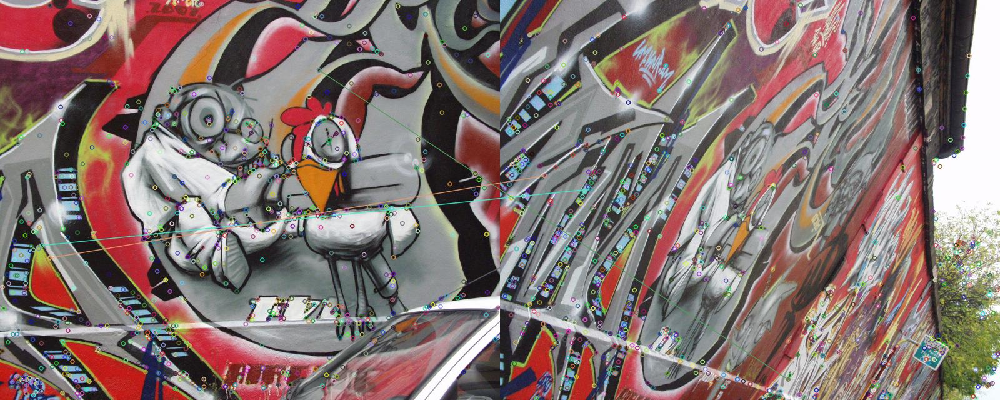

True Positives:	 0
False Positives:	 3
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  5


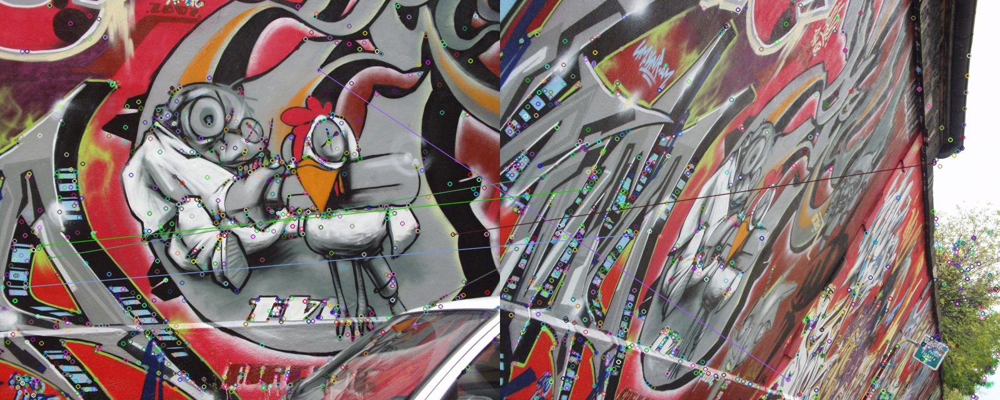

True Positives:	 0
False Positives:	 5
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  10


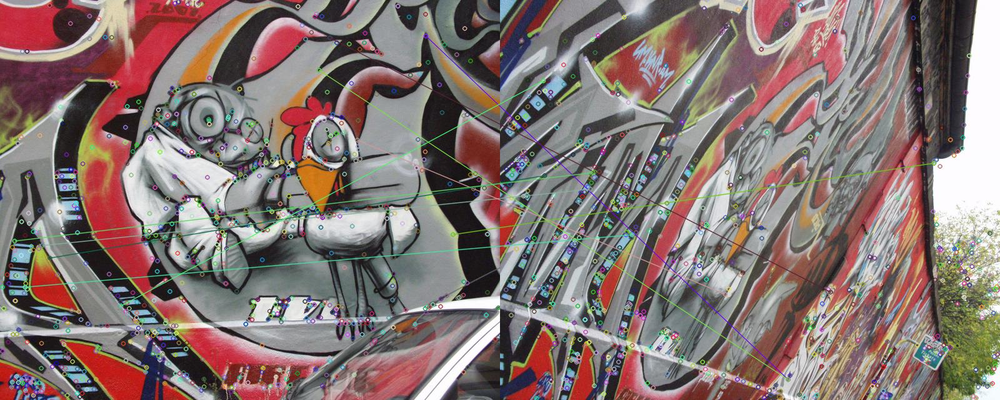

True Positives:	 0
False Positives:	 10
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  26


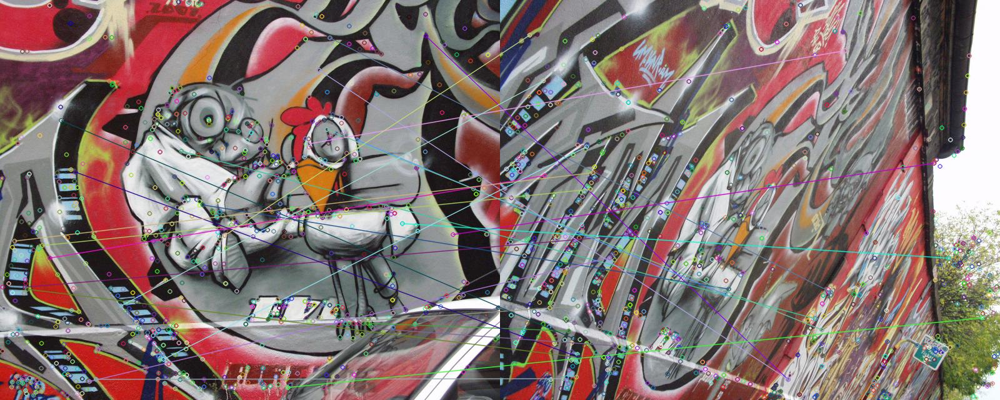

True Positives:	 0
False Positives:	 26
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  72


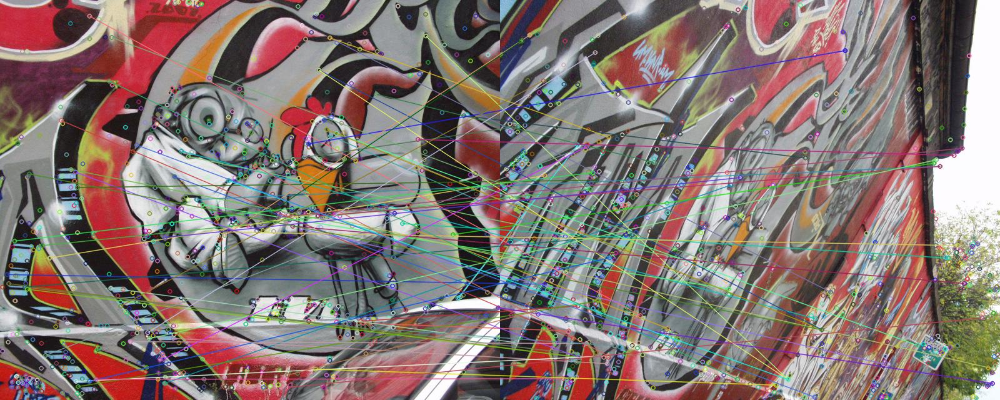

True Positives:	 0
False Positives:	 72
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  164


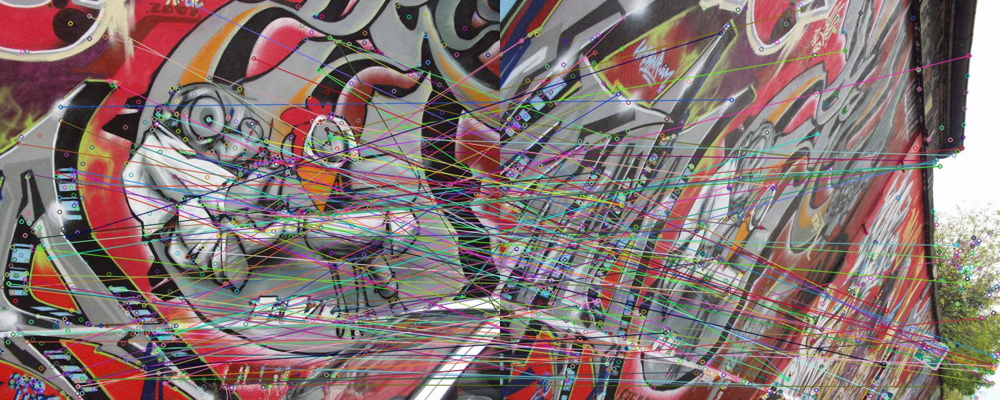

True Positives:	 0
False Positives:	 164
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  396


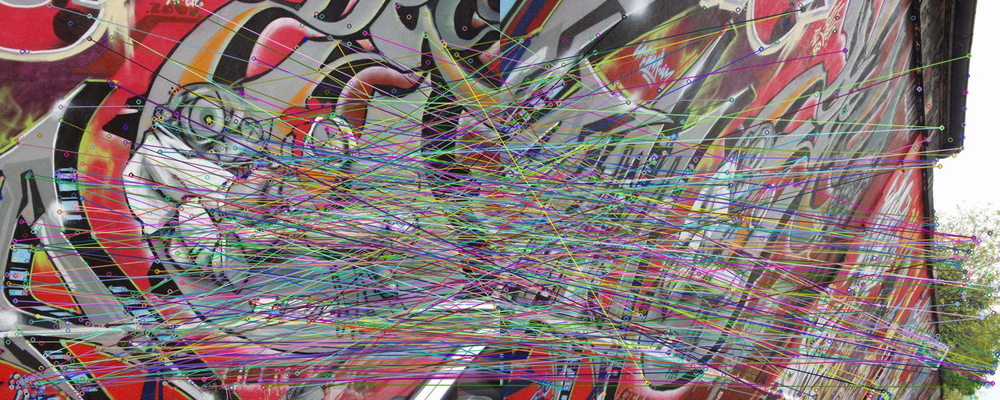

True Positives:	 0
False Positives:	 396
Actual Positives:	 904
Precision:	0.0
Recall:	0.0


Number of matches between images:  1001


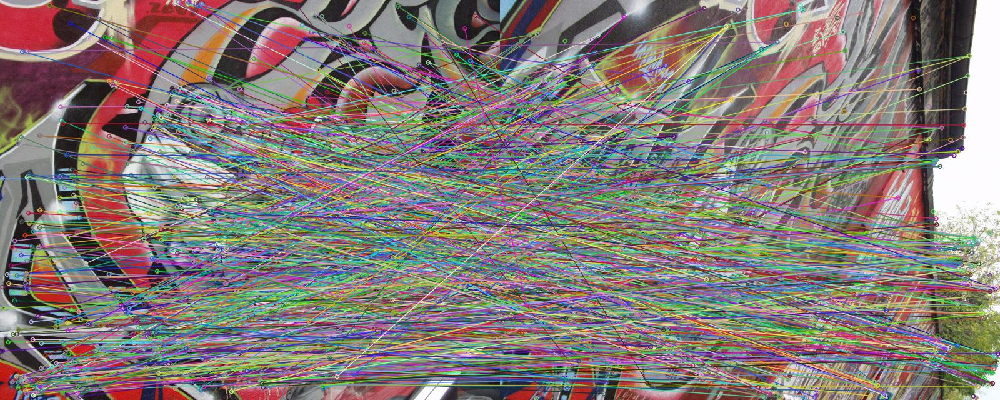

True Positives:	 2
False Positives:	 999
Actual Positives:	 904
Precision:	0.002
Recall:	0.0022


In [15]:
results = displayMatches(10)
table = f'''<div id="results" style="display: flex; flex-direction:column; width: 95%">'''
for img in results:
    table += (f'''
            <div class="result" style="display: flex; flex-direction: row; width: 95%; justify-content: flex-start; align-items: flex-start; margin: 1rem; position: relative;">
                <h3>{img}</h3></br>
                    <div class="result-values" style="display: flex; flex-direction: column;border-right: 1px solid black;">
                        <span class="distance" style="padding: 0.5rem; border-bottom: 1px solid black; border-right: 1px solid black; display: block; padding-right: 1.5rem">Distance Ratio</span>
                        <span class="precision" style="padding: 0.5rem; border-bottom: 1px solid black; border-right: 1px solid black; display: block; padding-right: 1.5rem;">Precision</span>
                        <span class="recall" style="padding: 0.5rem; border-bottom: 1px solid black; border-right: 1px solid black; display: block; padding-right: 1.5rem;">Recall</span>
                    </div>
                ''')
    for result in results[img]:
        table += (f'''
                    <div class="result-values" style="border-right: 1px solid black; display: flex; flex-direction: column;">
                        <span class="distance" style="margin: 0;border-bottom: 1px solid black; display: block; padding: 0.5rem;">{result[0]}</span>
                        <span class="precision" style="margin: 0;border-bottom: 1px solid black; display: block; padding: 0.5rem;">{result[1]}</span>
                        <span class="recall" style="margin: 0;border-bottom: 1px solid black; display: block; padding: 0.5rem;">{result[2]}</span>
                    </div>
                  ''')
    table += "</div>"
table += f'''</div>'''

display(HTML(table))